# Programming Project #1: Hybrid Images

## CS445: Computational Photography

### Part I: Hybrid Images

In [156]:
import cv2

import numpy as np
import scipy as sc
from matplotlib.colors import LogNorm
from scipy import signal

# modify to where you store your project data including utils.py
datadir = "/Users/pranav/Desktop/CS445/hybrid/" 




utilfn = datadir + "utils.py"
!cp "$utilfn" .
import utils

cp: ./utils.py and /Users/pranav/Desktop/CS445/hybrid/utils.py are identical (not copied).


In [157]:
# switch from notebook to inline if using colab or otherwise cannot use interactive display)
%matplotlib notebook  
import matplotlib.pyplot as plt

In [158]:
im1_file = datadir + 'tiger.jpg'
im2_file = datadir + 'man.jpg'

im1 = np.float32(cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE) / 255.0)
im2 = np.float32(cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE) / 255.0)

<IPython.core.display.Javascript object>


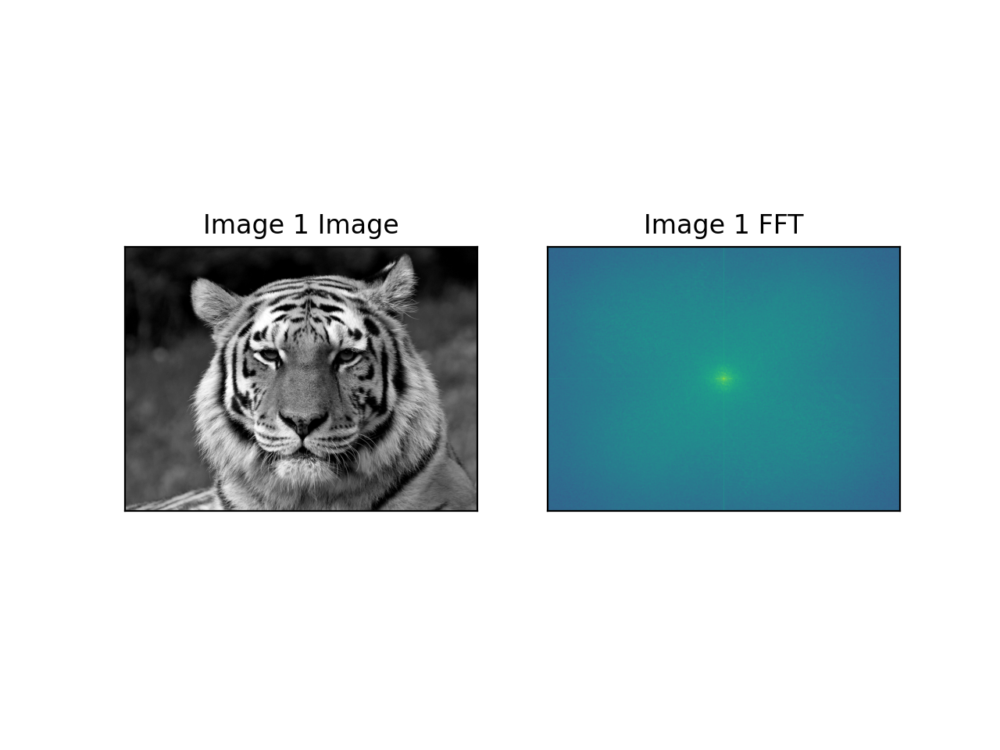

<IPython.core.display.Javascript object>


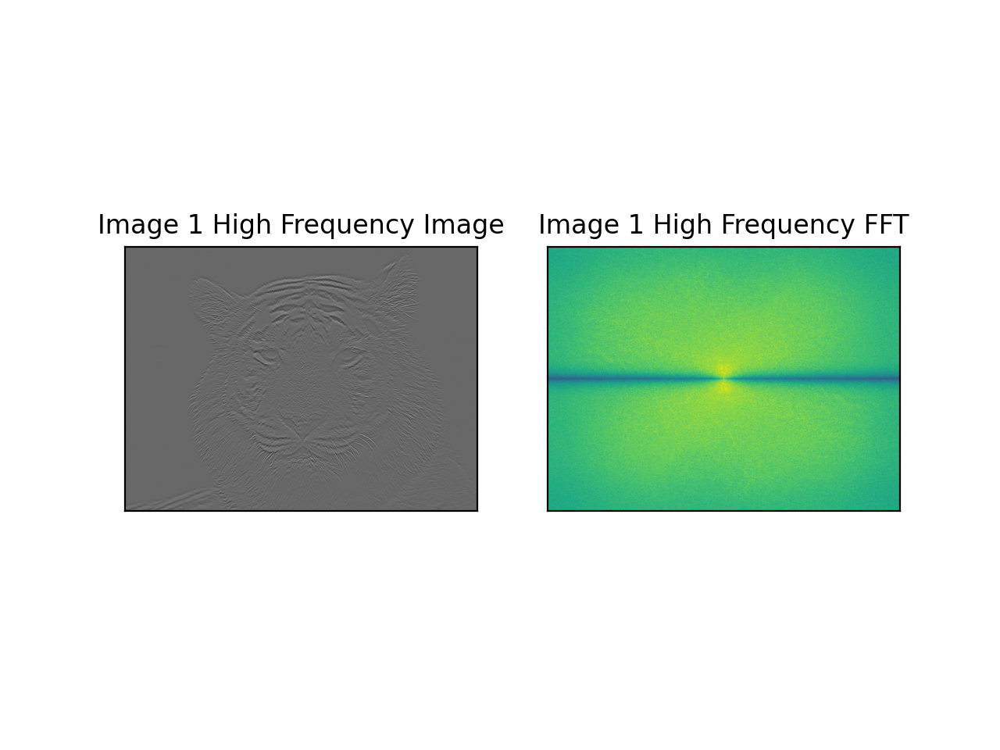

In [159]:
def apply_filter(image, sigma):
    kernel = cv2.getGaussianKernel(int(6 * sigma), sigma)
    return cv2.filter2D(image, -1, kernel)

def visualize_image_and_fft(image, title_prefix, axes):
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title(title_prefix + ' Image'), axes[0].set_xticks([]), axes[0].set_yticks([])
    
    fft_image = np.log(np.abs(np.fft.fftshift(np.fft.fft2(image))))
    axes[1].imshow(fft_image)
    axes[1].set_title(title_prefix + ' FFT'), axes[1].set_xticks([]), axes[1].set_yticks([])

def extract_high_frequency(im1, sigma_low):
    im1_filtered = im1 - apply_filter(im1, sigma_low)
    return im1_filtered

# Load your 'im1' image and set 'sigma_low' accordingly.
# Replace 'im1' and 'sigma_low' with your actual image and value.
im1_filtered = extract_high_frequency(im1, sigma_low)

# Create subplots for original and filtered images with their FFTs
fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im1, 'Image 1', axes)

fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im1_filtered, 'Image 1 High Frequency', axes)

plt.show()

<IPython.core.display.Javascript object>


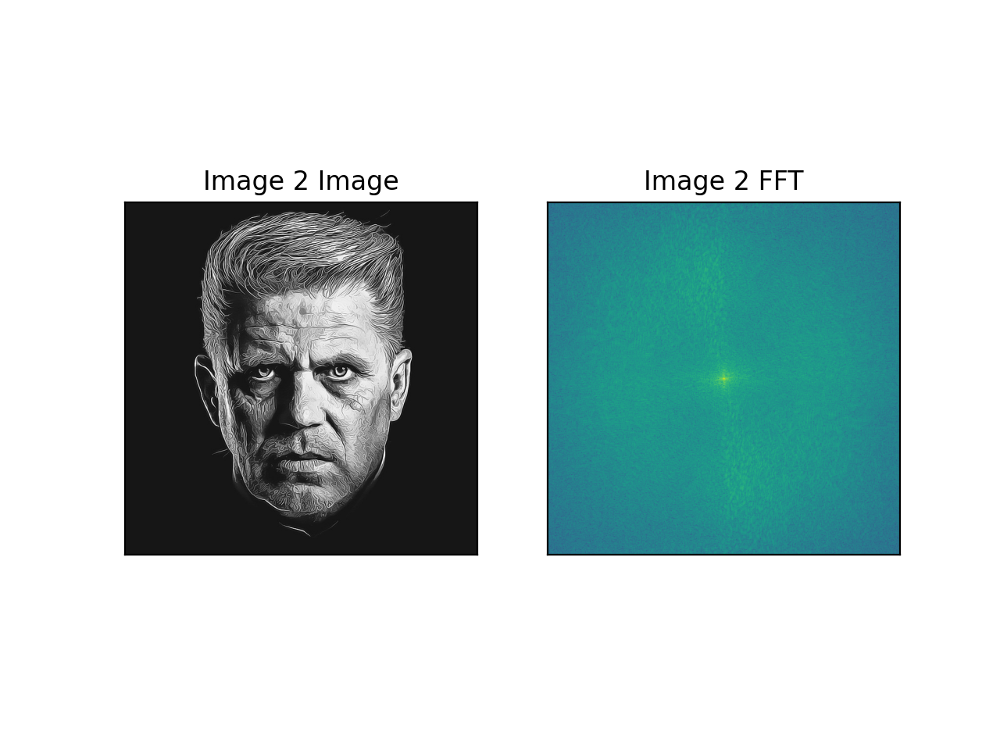

<IPython.core.display.Javascript object>


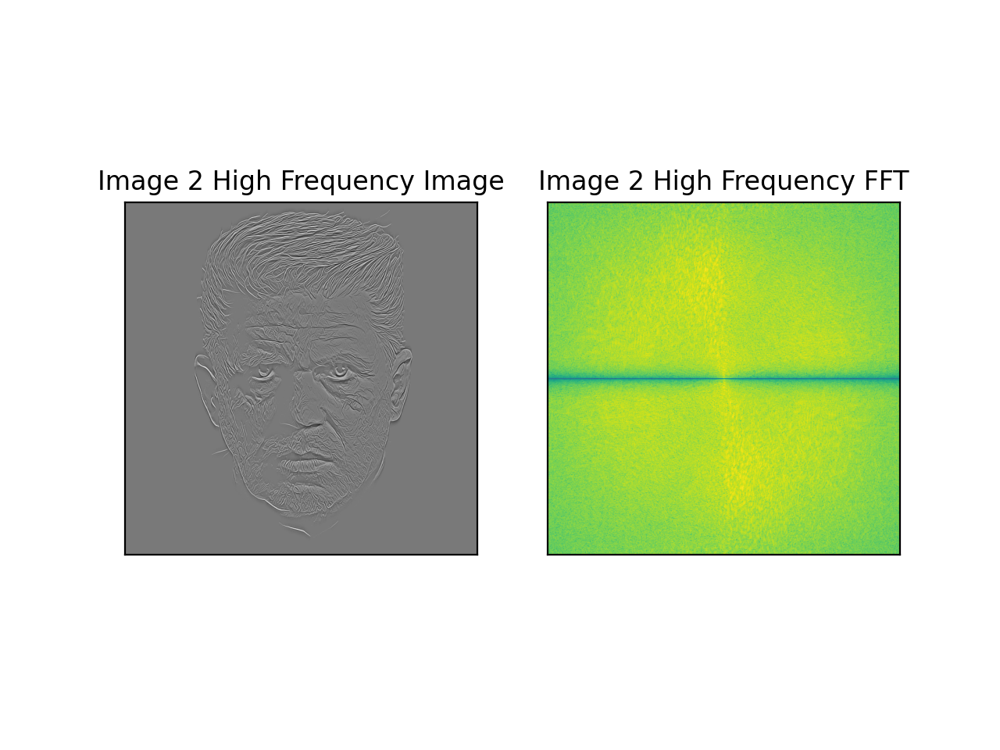

In [160]:
# Load your 'im2' image and set 'sigma_low' accordingly.
# Replace 'im2' and 'sigma_low' with your actual image and value.
im2_filtered = extract_high_frequency(im2, sigma_low)

# Create subplots for original and filtered images with their FFTs for Image 2
fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im2, 'Image 2', axes)

fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im2_filtered, 'Image 2 High Frequency', axes)

plt.show()


<IPython.core.display.Javascript object>


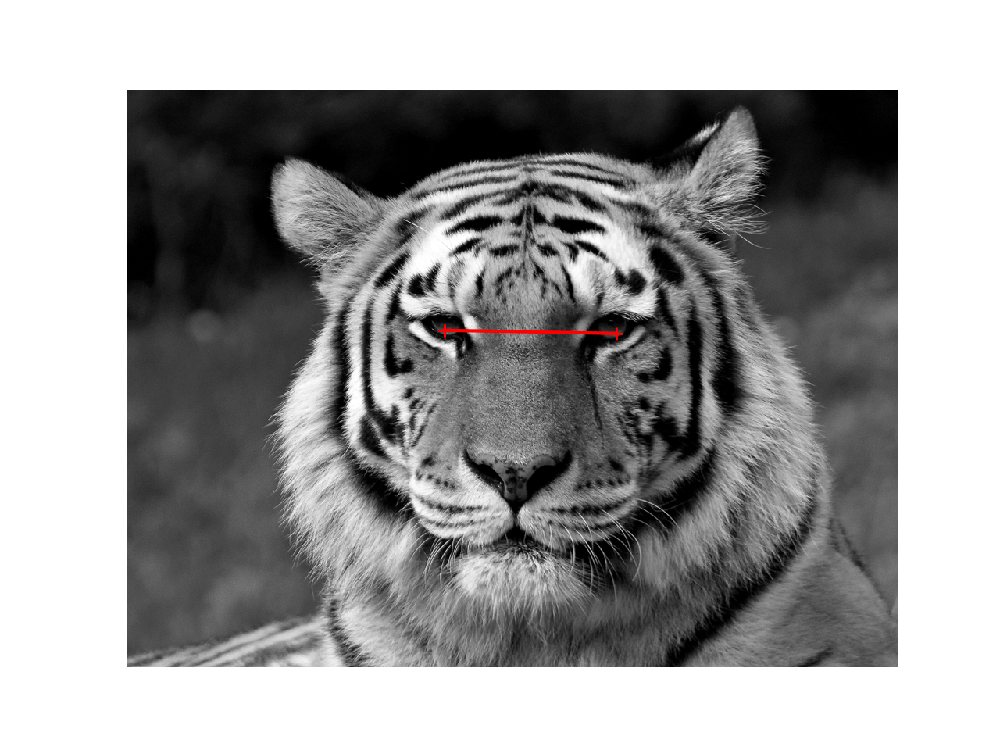

In [161]:
pts_im1 = utils.prompt_eye_selection(im1)

<IPython.core.display.Javascript object>


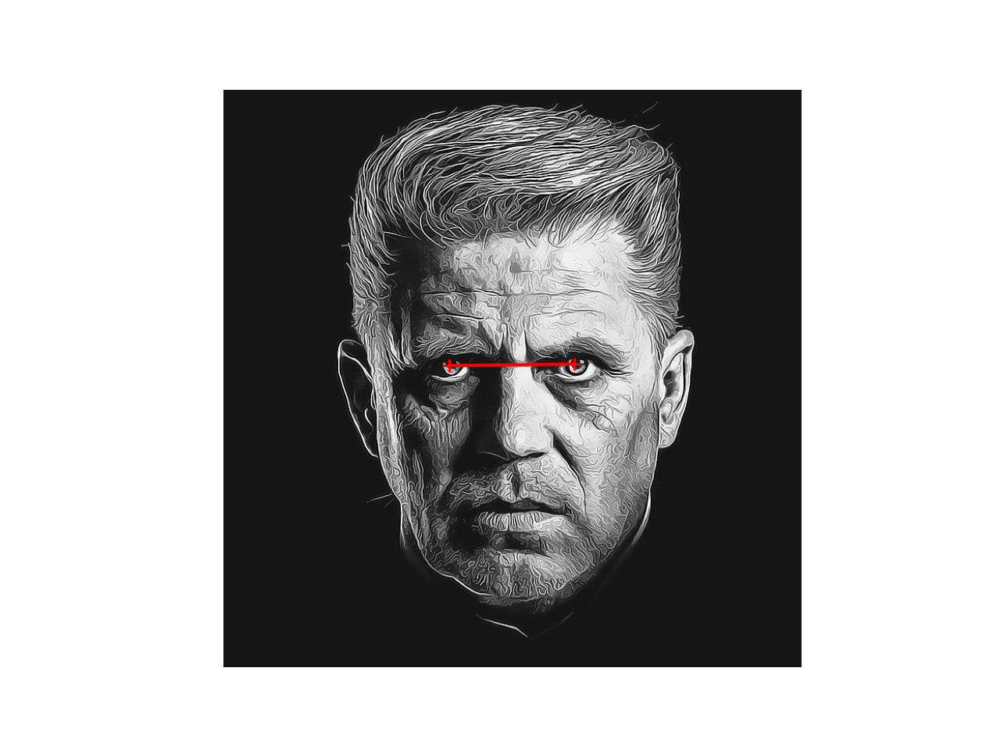

In [162]:
pts_im2 = utils.prompt_eye_selection(im2)

In [163]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)

In [164]:
# convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


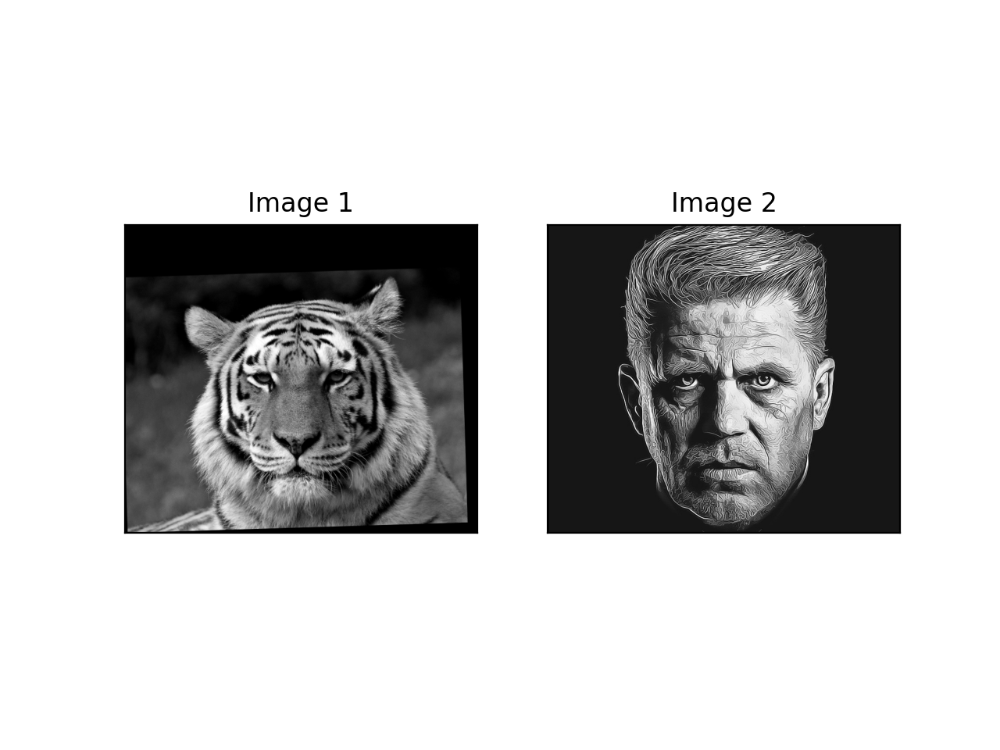

In [165]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

In [166]:
def hybridImage(im1, im2, sigma_low, sigma_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        sigma_low: standard deviation for the low-pass filter
        sigma_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''  
    # your code goes here  
    
    # Apply Gaussian filters to im1 and im2
    im1_lowpass = cv2.GaussianBlur(im1, (0, 0), sigma_low)
    im2_highpass = im2 - cv2.GaussianBlur(im2, (0, 0), sigma_high)
    
    # Combine the low-pass and high-pass images to create the hybrid image
    hybrid_image = im1_lowpass + im2_highpass
    
    return hybrid_image


In [169]:
sigma_low = 1 # choose parameters that work for your images
sigma_high = 100
im_hybrid = hybridImage(im2, im1, sigma_low, sigma_high)

<IPython.core.display.Javascript object>


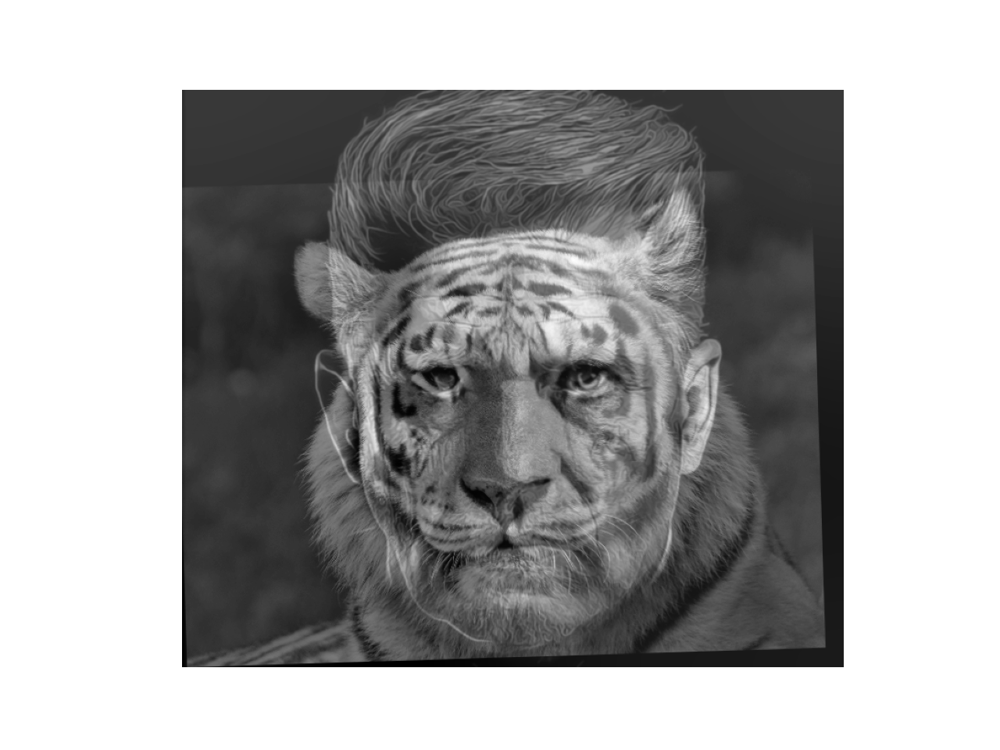

In [170]:
cropped_object = utils.interactive_crop(im_hybrid)

<IPython.core.display.Javascript object>


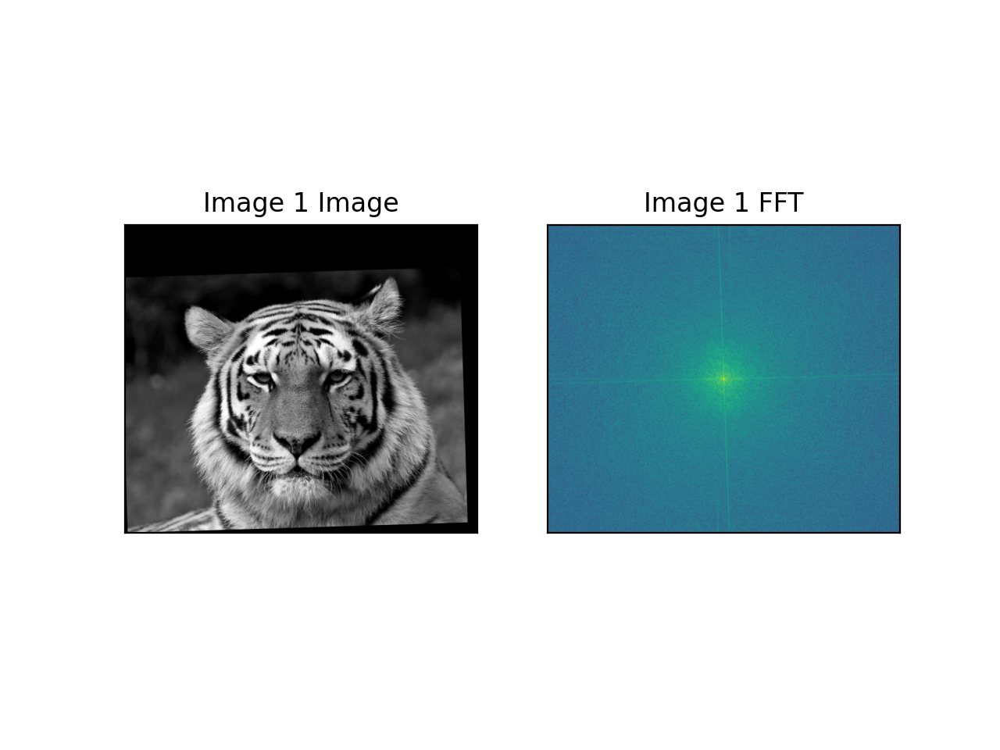

<IPython.core.display.Javascript object>


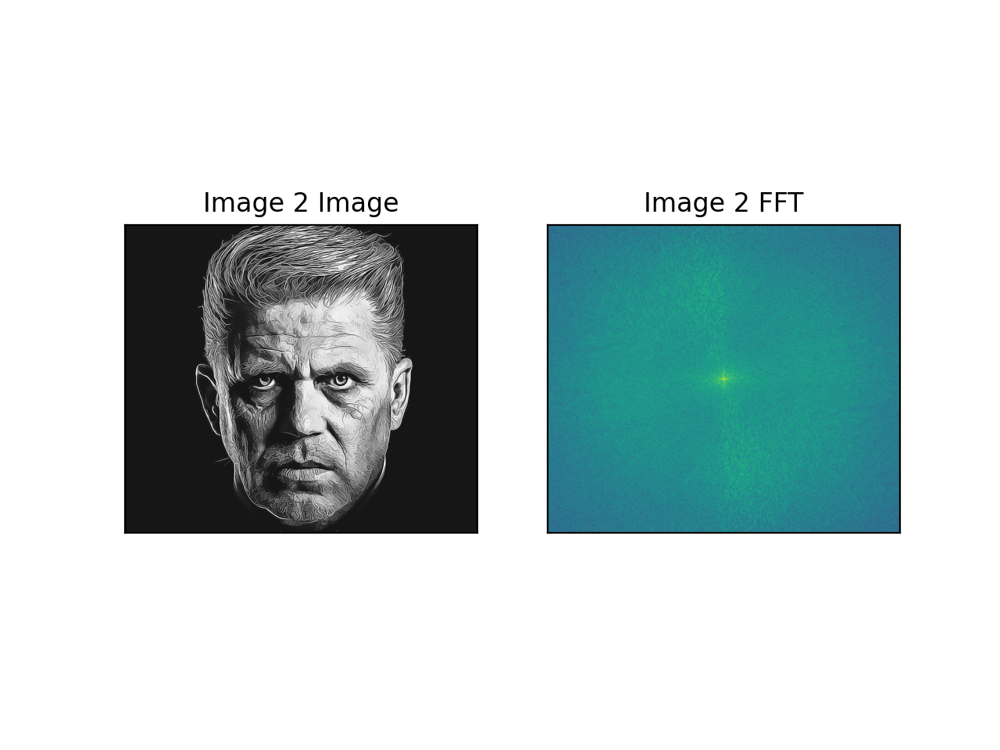

<IPython.core.display.Javascript object>


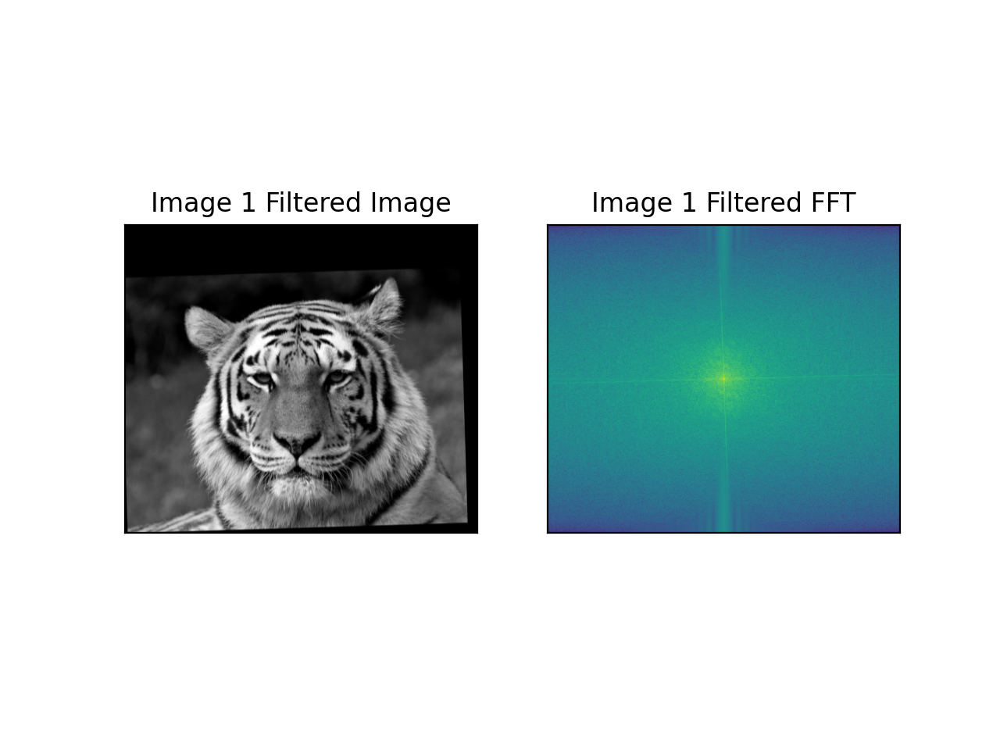

<IPython.core.display.Javascript object>


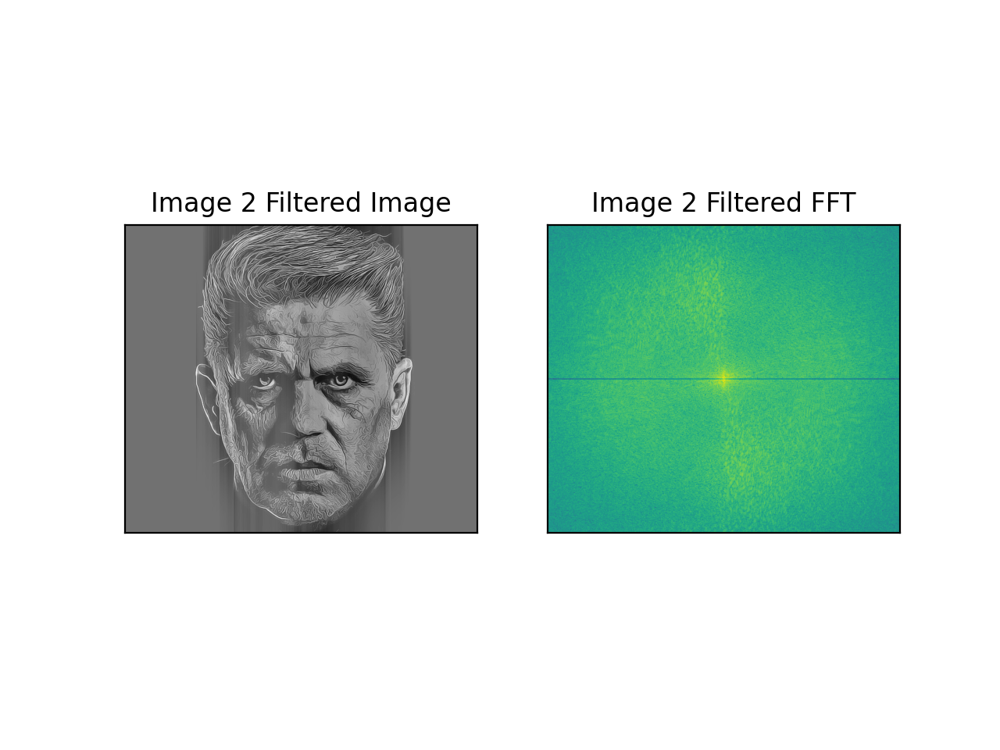

<IPython.core.display.Javascript object>


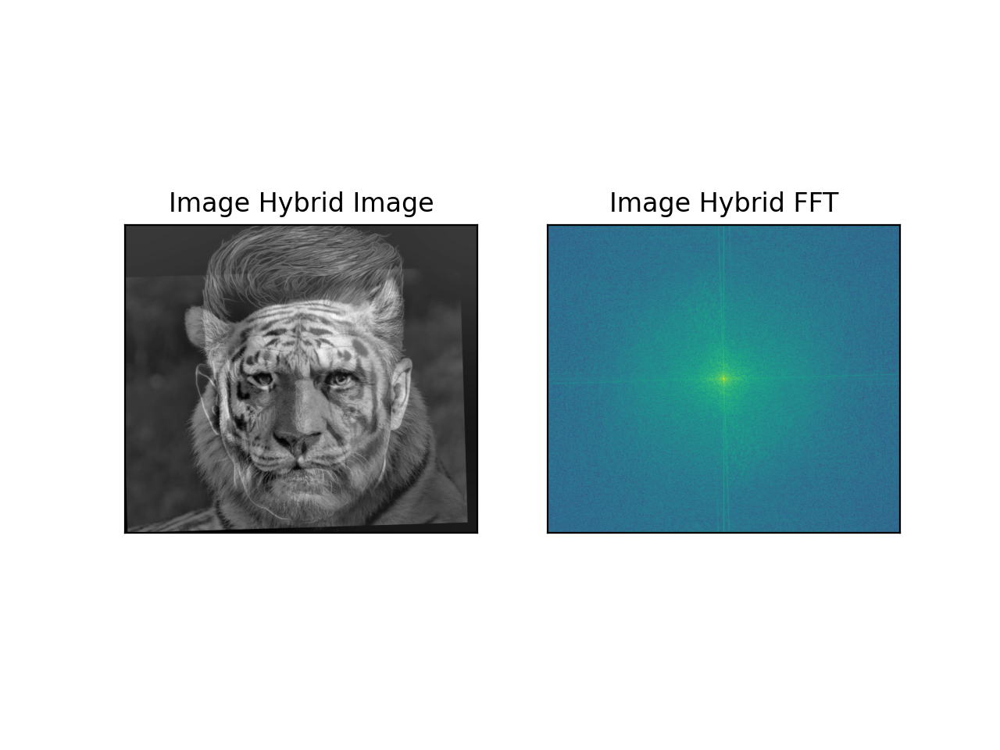

In [171]:
def apply_filter(image, sigma):
    kernel = cv2.getGaussianKernel(int(6 * sigma), sigma)
    return cv2.filter2D(image, -1, kernel)

def visualize_image_and_fft(image, title_prefix, axes):
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title(title_prefix + ' Image'), axes[0].set_xticks([]), axes[0].set_yticks([])
    
    fft_image = np.log(np.abs(np.fft.fftshift(np.fft.fft2(image))))
    axes[1].imshow(fft_image)
    axes[1].set_title(title_prefix + ' FFT'), axes[1].set_xticks([]), axes[1].set_yticks([])

def filtered_image(im1, im2, sigma_low, sigma_high):
    im1_filtered = apply_filter(im1, sigma_low)
    im2_filtered = im2 - apply_filter(im2, sigma_high)
    return im1_filtered, im2_filtered

# Load your images 'im1' and 'im2', and set 'sigma_low' and 'sigma_high' accordingly.
im1_filtered, im2_filtered = filtered_image(im1, im2, sigma_low, sigma_high)

# Create subplots for original and filtered images with their FFTs
fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im1, 'Image 1', axes)

fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im2, 'Image 2', axes)

fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im1_filtered, 'Image 1 Filtered', axes)

fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im2_filtered, 'Image 2 Filtered', axes)

# Finally, if you have 'im_hybrid', you can visualize it and its FFT as well.
fig, axes = plt.subplots(1, 2)
visualize_image_and_fft(im_hybrid, 'Image Hybrid', axes)

plt.show()

### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

<IPython.core.display.Javascript object>


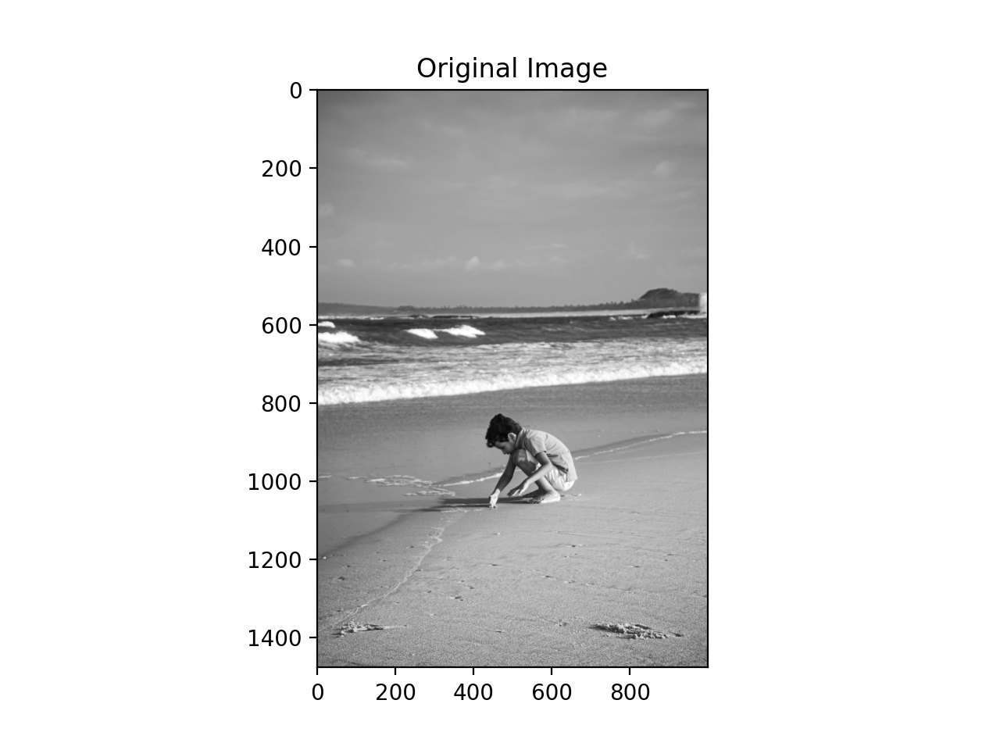

<IPython.core.display.Javascript object>


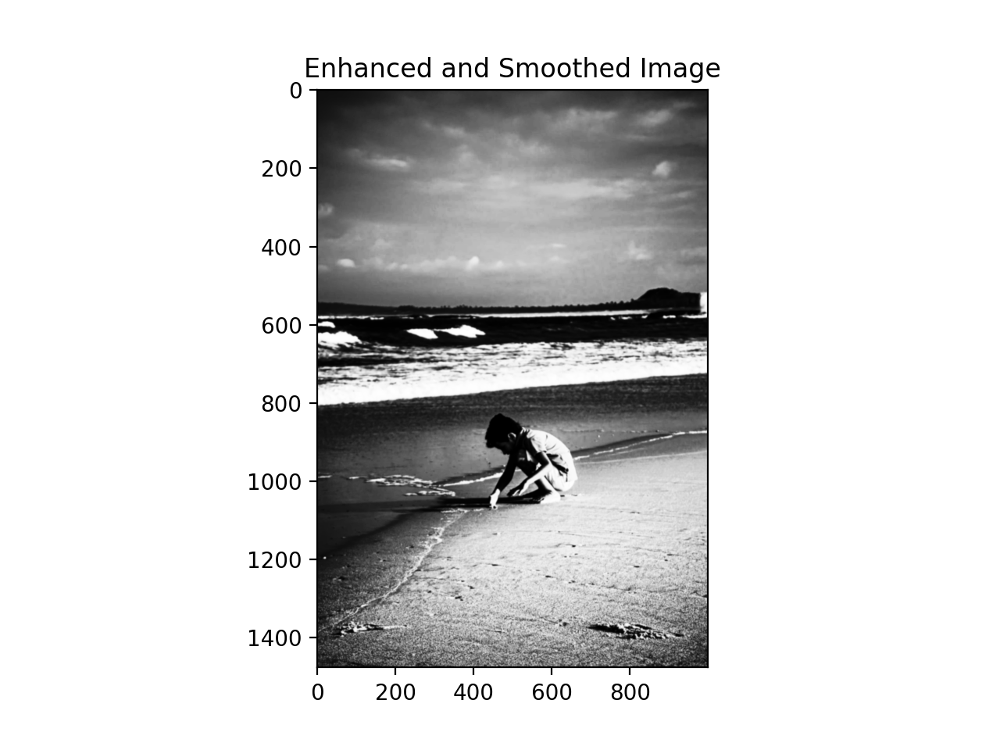

In [172]:
# Load an image in grayscale
input_image_file = './contrast.jpg'
input_image = cv2.imread(input_image_file, cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization to enhance contrast
equalized_image = cv2.equalizeHist(input_image)

# Apply Gaussian filtering for smoothing
sigma_value = 1
smoothed_image = sc.ndimage.gaussian_filter(equalized_image, sigma=sigma_value)

# Create subplots to display the original and processed images
plt.figure()
plt.imshow(input_image, cmap='gray')
plt.title("Original Image")

plt.figure()
plt.imshow(smoothed_image, cmap='gray')
plt.title("Enhanced and Smoothed Image")

# Show the plots
plt.show()


#### Color enhancement 

<IPython.core.display.Javascript object>


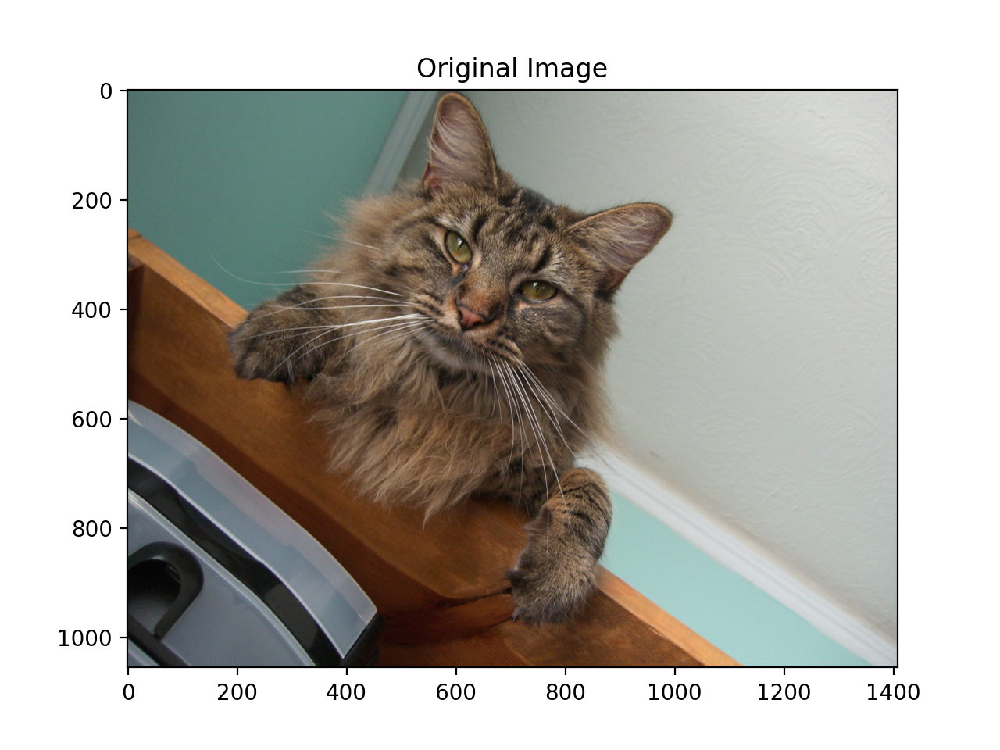

<IPython.core.display.Javascript object>


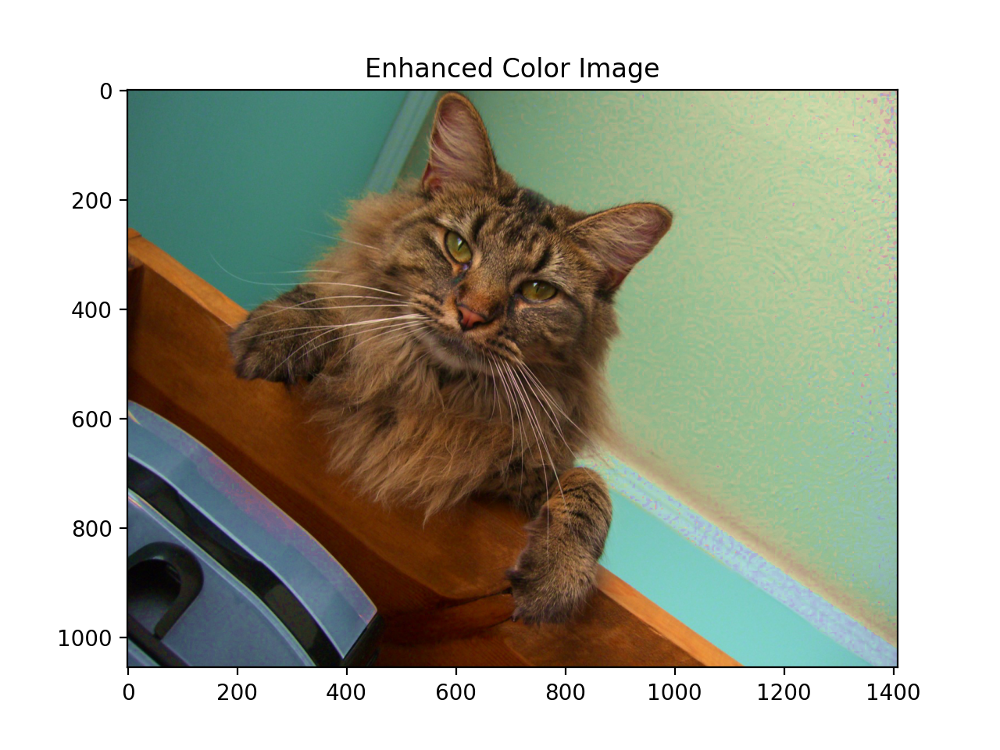

In [173]:
# Load an image
input_image_file = './nutmeg.jpg'
input_image = cv2.imread(input_image_file)

# Convert the input image to RGB color space
input_image_rgb = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

# Convert the input image to HSV color space
input_image_hsv = cv2.cvtColor(input_image, cv2.COLOR_BGR2HSV)

# Split the HSV channels
hue, saturation, value = cv2.split(input_image_hsv)

# Increase the saturation to make colors look brighter
saturation_increment = 50
saturation = cv2.add(saturation, saturation_increment)  # Add the increment to saturation

# Ensure that saturation values do not exceed 255
saturation[saturation > 255] = 255

# Merge the adjusted channels back into an HSV image
adjusted_hsv_image = cv2.merge((hue, saturation, value))

# Convert the adjusted HSV image back to RGB
output_image_rgb = cv2.cvtColor(adjusted_hsv_image, cv2.COLOR_HSV2RGB)

# Create subplots to display the original and adjusted images
plt.figure()
plt.imshow(input_image_rgb)
plt.title("Original Image")

plt.figure()
plt.imshow(output_image_rgb)
plt.title("Enhanced Color Image")

# Show the plots
plt.show()

#### Color shift

<IPython.core.display.Javascript object>


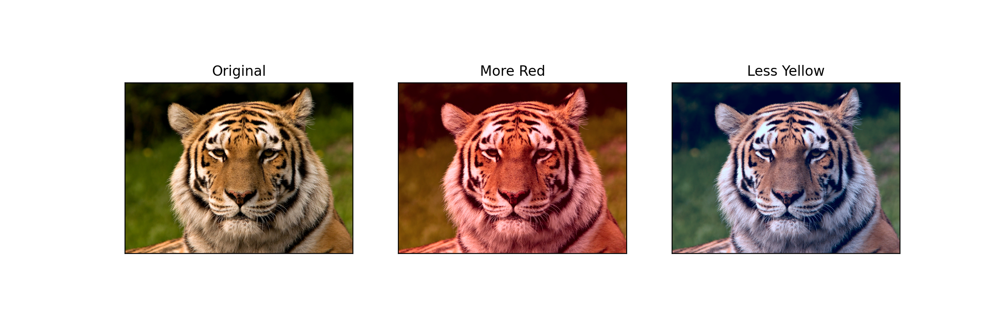

In [174]:
# Load an image of your choice
original_image = cv2.imread("./tiger.jpg")

# Convert the image from BGR to LAB color space
lab_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2Lab)

# Create copies of the LAB image for making color adjustments
more_red_image = lab_image.copy()
less_yellow_image = lab_image.copy()

# Increase the A channel for more red (but keep it within the valid range of [0, 255])
more_red_image[:, :, 1] = more_red_image[:, :, 1] + 30  # Increase redness

# Decrease the B channel for less yellow (but keep it within the valid range of [0, 255])
less_yellow_image[:, :, 2] = less_yellow_image[:, :, 2] - 30  # Decrease yellowness

# Ensure the A and B channel values do not exceed the valid range
more_red_image[:, :, 1][more_red_image[:, :, 1] > 255] = 255
less_yellow_image[:, :, 2][less_yellow_image[:, :, 2] < 0] = 0

# Convert the modified LAB images back to BGR for displaying
more_red_image_bgr = cv2.cvtColor(more_red_image, cv2.COLOR_Lab2BGR)
less_yellow_image_bgr = cv2.cvtColor(less_yellow_image, cv2.COLOR_Lab2BGR)

# Create subplots for displaying the images
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Display the original image
axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
axes[0].set_xticks([]), axes[0].set_yticks([])
axes[0].set_title("Original")

# Display the image with more red
axes[1].imshow(cv2.cvtColor(more_red_image_bgr, cv2.COLOR_BGR2RGB))
axes[1].set_xticks([]), axes[1].set_yticks([])
axes[1].set_title("More Red")

# Display the image with less yellow
axes[2].imshow(cv2.cvtColor(less_yellow_image_bgr, cv2.COLOR_BGR2RGB))
axes[2].set_xticks([]), axes[2].set_yticks([])
axes[2].set_title("Less Yellow")

# Show the plot
plt.show()